### Empirical mode decomposition of the signal

In [1]:
import sys

sys.path.insert(1, "/home/vinicius/storage1/projects/vanderbilt")

In [2]:
import os

import emd
import igraph as ig
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import PyEMD
import scipy
import skimage as ski
import umap
import xarray as xr
from frites.utils import parallel_func
from mne.time_frequency import psd_array_multitaper
from scipy.optimize import curve_fit
from skimage.segmentation import watershed
from tqdm import tqdm

from config import metadata
from VUDA.emd import emd_vec
from VUDA.io.loadbinary import LoadBinary

/home/vinicius/anaconda3/envs/ipp/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/vinicius/anaconda3/envs/ipp/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/vinicius/anaconda3/envs/ipp/lib/python3.9/site-packages/umap/distanc

#### Functions

In [3]:
from functools import partial

import jax
import jax.numpy as jnp

jax.config.update("jax_platform_name", "cpu")


def get_bc(cycles, freq, k_sd=5):
    return cycles / (k_sd * freq)


def cxmorelet(freq, cycles, sampling_freq):
    t = jnp.linspace(-1, 1, sampling_freq * 2)

    bc = get_bc(cycles, freq)
    norm = 1 / (bc * jnp.sqrt(2 * jnp.pi))
    gauss = jnp.exp(-(t**2) / (2 * bc**2))
    sine = jnp.exp(1j * 2 * jnp.pi * freq * t)

    wavelet = norm * gauss * sine
    return wavelet / jnp.sum(jnp.abs(wavelet))


@partial(jax.jit, static_argnums=3)
@partial(jax.vmap, in_axes=(None, 0, None, None))
def wavelet_transform(signal, freq, cycles, sampling_freq):
    wavelet = cxmorelet(freq, cycles, sampling_freq)
    return jax.scipy.signal.convolve(signal, wavelet, mode="same")


@partial(jax.jit, static_argnums=3)
@partial(jax.vmap, in_axes=(None, None, 0, None))
def superlet_transform_helper(signal, freqs, order, sampling_freq):
    return wavelet_transform(signal, freqs, order, sampling_freq) * jnp.sqrt(2)


def order_to_cycles(base_cycle, max_order, mode):
    if mode == "add":
        return jnp.arange(0, max_order) + base_cycle
    elif mode == "mul":
        return jnp.arange(1, max_order + 1) * base_cycle
    else:
        raise ValueError('mode should be one of "mul" or "add"')


def get_order(f, f_min: int, f_max: int, o_min: int, o_max: int):
    return o_min + jnp.round((o_max - o_min) * (f - f_min) / (f_max - f_min))


@partial(jax.vmap, in_axes=(0, None))
def get_mask(order, max_order):
    return jnp.arange(1, max_order + 1) > order


@jax.jit
def norm_geomean(X, root_pows, eps):
    X = jnp.log(X + eps).sum(axis=0)

    return jnp.exp(X / jnp.array(root_pows).reshape(-1, 1))


# @jax.jit
def adaptive_superlet_transform(
    signal,
    freqs,
    sampling_freq: int,
    base_cycle: int,
    min_order: int,
    max_order: int,
    eps=1e-12,
    mode="mul",
):
    """Computes the adaptive superlet transform of the provided signal
    Args:
        signal (jnp.ndarray): 1D array containing the signal data
        freqs (jnp.ndarray): 1D sorted array containing the frequencies to compute the wavelets at
        sampling_freq (int): Sampling frequency of the signal
        base_cycle (int): The number of cycles corresponding to order=1
        min_order (int): The minimum upper limit of orders to be used for a frequency in the adaptive superlet.
        max_order (int): The maximum upper limit of orders to be used for a frequency in the adaptive superlet.

        eps (float, optional): Epsilon value to be used for numerical stability in the geometric mean. Defaults to 1e-12.
        mode (str, optional): "add" or "mul", corresponding to the use of additive or multiplicative adaptive superlets. Defaults to "mul".
    Returns:
        jnp.ndarray: 2D array (Frequency x Time) representing the computed scalogram
    """
    cycles = order_to_cycles(base_cycle, max_order, mode)
    orders = get_order(freqs, min(freqs), max(freqs), min_order, max_order)
    mask = get_mask(orders, max_order)

    out = superlet_transform_helper(signal, freqs, cycles, sampling_freq)
    out = out.at[mask.T].set(1)

    return norm_geomean(out, orders, eps)


def superlets(
    data,
    freqs,
    sampling_freq,
    base_cycle=3,
    min_order=1,
    max_order=30,
    eps=1e-12,
    mode="mul",
):
    if not isinstance(data, jax.numpy.ndarray):
        data = jnp.array(data)
    if not isinstance(freqs, jax.numpy.ndarray):
        freqs = jnp.array(freqs)

    _fcn = partial(
        adaptive_superlet_transform,
        freqs=freqs,
        sampling_freq=sampling_freq,
        base_cycle=base_cycle,
        min_order=min_order,
        max_order=max_order,
        eps=eps,
        mode=mode,
    )

    def _loop(carry, array):
        return carry, _fcn(array)

    tf = jax.vmap(jax.vmap(_fcn, in_axes=(0,)), in_axes=(0,))

    return tf(data)

In [4]:
def jax_euclidean(matrix: np.ndarray) -> np.ndarray:
    """
    Calculate the element-wise absolute difference of each row in the matrix from the matrix itself.

    Parameters:
    - matrix (np.ndarray): Input matrix.

    Returns:
    - np.ndarray: Resulting matrix of absolute differences.
    """

    def _for_each(carry, row):
        return carry, jnp.abs((row - matrix))

    _, result = jax.lax.scan(_for_each, None, matrix)
    return result


def resolve_neighborhood(data: np.ndarray) -> np.ndarray:
    """
    Resolve neighborhood relationships in the input data based on a threshold.

    Parameters:
    - data (np.ndarray): Input thresholded data.
    Returns:
    - np.ndarray: Boolean array indicating neighborhood relationships.
    """
    data = jnp.array(data, dtype=np.float32)

    # Get index coordinates of values where the mask is true
    pairs = np.stack(np.where(data), axis=1)

    def _for_pair(carry, pair):
        x = jnp.abs(pair - pairs)
        # No difference in coordinate x_i - x_j can be greater than one
        # and at least one x_i has to be one for being a neighbor
        return carry, jnp.logical_and((x == 1).any(axis=1), ~(x > 1).any(axis=1))

    _, result = jax.lax.scan(_for_pair, None, pairs)

    return result, pairs


def return_labeled_blobs(data: np.ndarray, thr: float) -> np.ndarray:
    """
    Return labeled blobs in the input data based on neighborhood relationships.

    Parameters:
    - data (np.ndarray): Input data.
    - thr (float): Threshold value.

    Returns:
    - np.ndarray: Labeled blobs.
    """

    # Threshold data
    mask = data >= thr

    d, pairs = resolve_neighborhood(mask)

    G = nx.from_numpy_array(d)

    labels = np.zeros(d.shape[0], dtype=int)
    cc = sorted(nx.connected_components(G))

    for l, cc_ in enumerate(cc):
        idx = np.array(list(cc_))
        labels[idx] = l + 1

    # Create a labeled array
    labeled = np.array(mask, dtype=int)
    labeled[tuple(pairs.T)] = labels

    return labeled

In [5]:
def return_labeled_image(img: list, threshold: float):
    """
    Label regions in a binary image using a given threshold.

    Parameters:
    - img (numpy.ndarray): The binary image to label.
    - threshold (float): The threshold for labeling.

    Returns:
    - numpy.ndarray: A labeled image with connected regions.
    - numpy.ndarray: Array of unique labels.
    - int: The number of unique labels.

    This function labels connected regions in a binary image based on a given threshold.
    It uses the `ski.measure.label` function from the scikit-image library to perform
    the labeling. The resulting labeled image contains connected regions with unique
    labels, and the number of labels is also returned.

    Example:
    labeld_image, labels, nlabels = return_labeled_image(binary_img, 0.5)
    """
    # Labeled image
    labeld_image = ski.measure.label(img > threshold, background=0)
    # Get unique labels
    labels = np.unique(labeld_image)[1:]
    # Number of labels
    nlabels = len(labels)

    return labeld_image, labels, nlabels


def detect_burts(
    spectra: xr.DataArray,
    init_threshold: float,
    min_threshold: float,
    gamma: float,
    relative: bool = True,
):
    """
    Detect bursts in spectra using a dynamic thresholding approach.

    Parameters:
    - spectra (numpy.ndarray): The input spectra to analyze.
    - init_threshold (float): The initial threshold for labeling.
    - min_threshold (float): The minimum threshold to stop the labeling process.

    Returns:
    - numpy.ndarray: An image with labeled bursts.

    This function detects bursts in a given spectra by iteratively updating a labeling
    based on threshold values. It starts with an initial threshold, and in each iteration,
    it updates the labeling using a lower threshold. The process continues until the
    threshold reaches the minimum threshold value. The resulting labeled image contains
    burst regions.

    Note: The input spectra are first z-scored before applying labeling.

    Example:
    labeled_bursts = detect_burts(spectra_data, 2.0, 1.0)
    """
    # Dimensions of the spectra
    size = spectra.shape
    # z-score spectra
    if relative:
        z = (spectra - spectra.mean("times")) / spectra.std("times")
    else:
        z = (spectra - spectra.mean()) / spectra.std()
    # label image using initial threshold
    labeled_image, labels, nlabels = return_labeled_image(z, init_threshold)

    # Update threshold
    thr = init_threshold - gamma

    while thr >= min_threshold:

        # Label image for new threshold
        new_labeled_image, new_labels, new_nlabels = return_labeled_image(z, thr)
        # Work with the flattened matrix
        new_labeled_image = new_labeled_image.reshape(-1)

        # Copy original image
        temp = labeled_image.copy().reshape(-1)
        # Get biggest label
        max_label = labels.max()

        # Check mergings of burts
        for nl in new_labels:
            # For a given label in the new labeled image
            index_nl = np.where(new_labeled_image == nl)[0]
            # Check if in the previous one it corresponded to two or more burts
            if len(np.unique(temp[index_nl])) > 2:
                # If yes, keep old labeling
                new_labeled_image[index_nl] = temp[index_nl]

        # Check if new labels contain old ones
        for nl in new_labels:
            # For a given label in the new labeled image
            intersection = []
            index_nl = np.where(new_labeled_image == nl)[0]
            # For a given label in the old labeled image
            for l in labels:
                # Keep the indexes where new-contains-old labels
                index_l = np.where(labeled_image == l)[0]
                if len(np.isin(index_l, index_nl)):
                    intersection.append(l)

            # Update region of intersect in case any was found
            if len(intersection) > 0:
                intersection = np.hstack(intersection)
                indexes = np.where(np.intersect1d(temp, intersection))
                temp[index_nl] = intersection.max()
            else:
                max_label = max_label + 1
                temp[index_nl] = max_label

        # Update labeled image
        labeled_image, labels, nlabels = new_labeled_image, new_labels, new_nlabels
        # Update threshold
        thr = thr - gamma

    # Reset labels in the final image
    labeled_image, labels, nlabels = return_labeled_image(
        labeled_image.reshape(size), 0
    )

    return labeled_image

In [6]:
def to_bin_freq(freqs, peaks):

    n_blocks, n_peaks = peaks.shape
    n_freqs = freqs.shape[0]

    def _for_peak(carry, peak):

        vec = jnp.zeros(n_freqs, dtype=int)
        indexes = jnp.stack(
            [jnp.argmin(jnp.abs(freqs - peak[i])) for i in range(n_peaks)]
        )
        vec = vec.at[indexes].set(1)
        return carry, vec

    _, vec = jax.lax.scan(_for_peak, None, peaks)

    return np.asarray(vec)

#### Load data

In [7]:
date = "10-20-2022"
monkey = "FN"
max_imfs = None
method = "eemd"


composites_path = os.path.expanduser(
    f"~/funcog/HoffmanData/{monkey}/{date}/composite_signals_task_method_eemd_max_imfs_None.nc"
)

ps_composites_path = os.path.expanduser(
    f"~/funcog/HoffmanData/{monkey}/{date}/ps_composite_signals_task_method_eemd_max_imfs_None.nc"
)

In [8]:
composites = xr.open_dataset(composites_path)
ps_composites = xr.open_dataset(ps_composites_path)

#### Spectral bands channels

In [11]:
kernel = np.hanning(50)

In [13]:
channels = list(composites.keys())

In [15]:
peaks = []

for channel in tqdm(channels):
    data = ps_composites[channel].dropna("IMFs")
    freqs = data.freqs.data

    data_sm = xr.DataArray(
        scipy.signal.fftconvolve(data, kernel[None, None, :], mode="same", axes=2),
        dims=data.dims,
        coords=data.coords,
    )

    freqs = data.freqs.data

    n_blocks, n_IMFs, n_freqs = data.shape

    peaks += [freqs[data_sm.argmax("freqs").data]]

100%|█████████████████████████████████████████████████████████| 40/40 [00:47<00:00,  1.20s/it]


In [16]:
plt.figure(figsize=(20, 20), dpi=600)
for pos in range(len(channels)):
    plt.subplot(10, 4, pos + 1)
    for i in range(peaks[pos].shape[1]):
        plt.scatter(peaks[pos][:, i], np.arange(200, dtype=int), s=5)
    plt.ylim(-3, 203)

    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Blocks")
    plt.title(f"Channel {pos + 1}")
plt.tight_layout()

Text(0.5, 0, 'Frequency [Hz]')

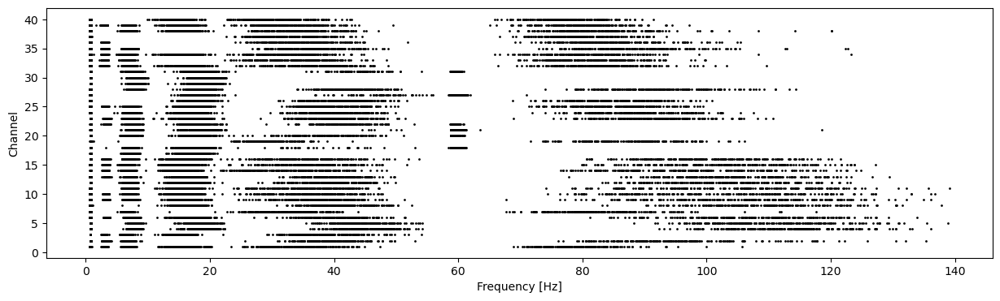

In [19]:
plt.figure(figsize=(15, 4))
d = []
for pos in range(len(channels)):
    x = peaks[pos].flatten()
    d += [x]
    plt.scatter(x, [pos + 1] * len(x), s=1, c="k")
plt.ylabel("Channel")
plt.xlabel("Frequency [Hz]")

In [38]:
X = []

for channel in tqdm(channels):
    data = ps_composites[channel].load().dropna("IMFs")
    x = composites[channel].load().dropna("IMFs")

    freqs = data.freqs.data
    kernel = np.hanning(50)

    data_sm = xr.DataArray(
        scipy.signal.fftconvolve(data, kernel[None, None, :], mode="same", axes=2),
        dims=data.dims,
        coords=data.coords,
    )

    freqs = data.freqs.data

    n_blocks, n_IMFs, n_freqs = data.shape

    peaks = freqs[data_sm.argmax("freqs")]

    slow_idx = np.logical_and(peaks.flatten() >= 0, peaks.flatten() <= 10).reshape(
        peaks.shape
    )

    fast_idx = np.logical_and(peaks.flatten() >= 55, peaks.flatten() <= np.inf).reshape(
        peaks.shape
    )

    slow = (x * slow_idx[..., None]).sum("IMFs")
    fast = (x * fast_idx[..., None]).sum("IMFs")
    X += [xr.concat((slow, fast), "components")]

100%|█████████████████████████████████████████████████████████| 40/40 [00:32<00:00,  1.22it/s]


In [39]:
X = xr.concat(X, "channels")

In [45]:
freqs = np.linspace(3, 150, 50)

W = []
for i in tqdm(range(40)):
    w = adaptive_superlet_transform(
        X.sel(blocks=100, components=1, channels=i).data,
        freqs,
        sampling_freq=1000,
        base_cycle=3,
        min_order=1,
        max_order=30,
        eps=1e-12,
        mode="mul",
    )

    W += [np.real(w * np.conj(w))]

100%|█████████████████████████████████████████████████████████| 40/40 [00:52<00:00,  1.32s/it]


In [46]:
W = xr.DataArray(
    np.stack(W), dims=("channels", "freqs", "times"), coords={"freqs": freqs}
)

In [50]:
sxx = (W - W.mean(("times", "freqs"))) / W.std(("times", "freqs"))

Text(0.5, 0, 'time')

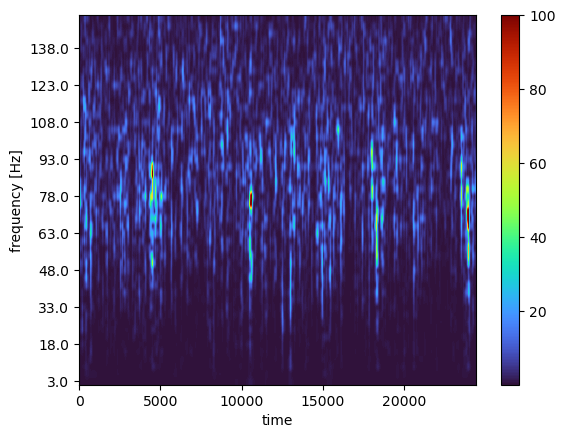

In [58]:
plt.imshow(
    W[33],
    aspect="auto",
    cmap="turbo",
    vmax=100,
    origin="lower",
)
plt.yticks(np.arange(len(freqs))[::5], np.round(freqs[::5], 0))
plt.colorbar()
plt.ylabel("frequency [Hz]")
plt.xlabel("time")

In [ ]:
%timeit return_labeled_blobs(sxx.isel(times=slice(10000, 12000)).data, 3)

IndexError: index 2 is out of bounds for axis 1 with size 2

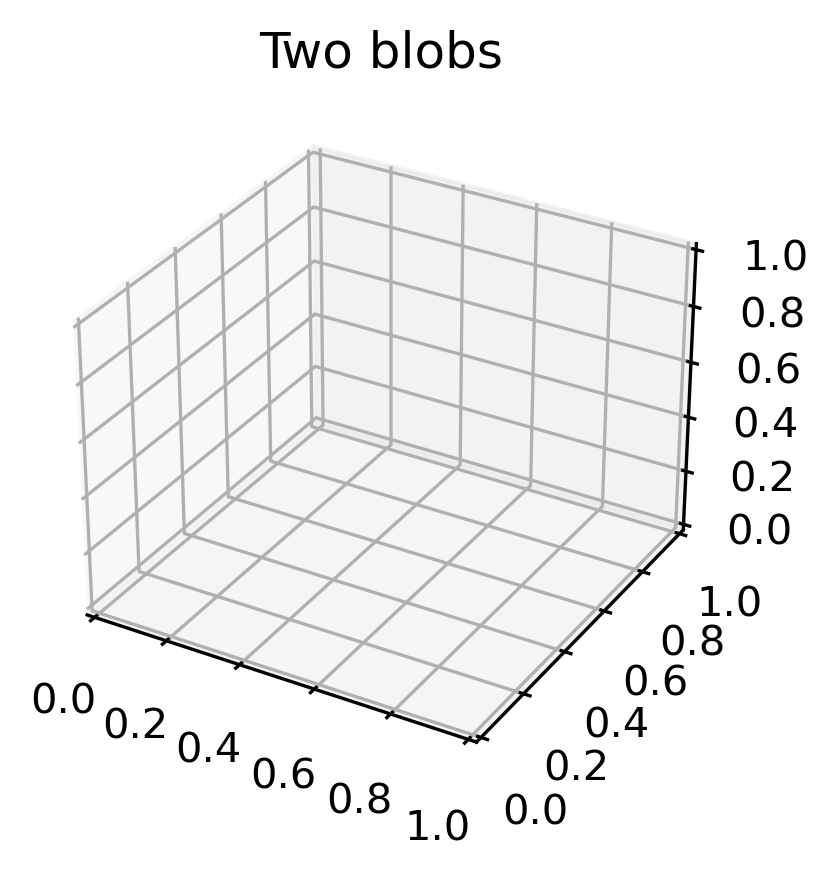

In [278]:
nonzero_coords = np.transpose(np.nonzero(sxx.isel(times=slice(10000, 15000)).data >= 3))

# Visualize the 3D matrix
fig = plt.figure(figsize=(3, 3), dpi=300)
ax = fig.add_subplot(111, projection="3d")
plt.title("Two blobs")

# Scatter plot for each non-zero element
ax.scatter(
    nonzero_coords[:, 2], nonzero_coords[:, 1], nonzero_coords[:, 0], c="b", marker="o"
)

ax.set_xlabel("Time")
ax.set_ylabel("Frequency")
ax.set_zlabel("Channels", labelpad=-5)
ax.view_init(elev=0, azim=45)

ValueError: not enough values to unpack (expected 3, got 2)

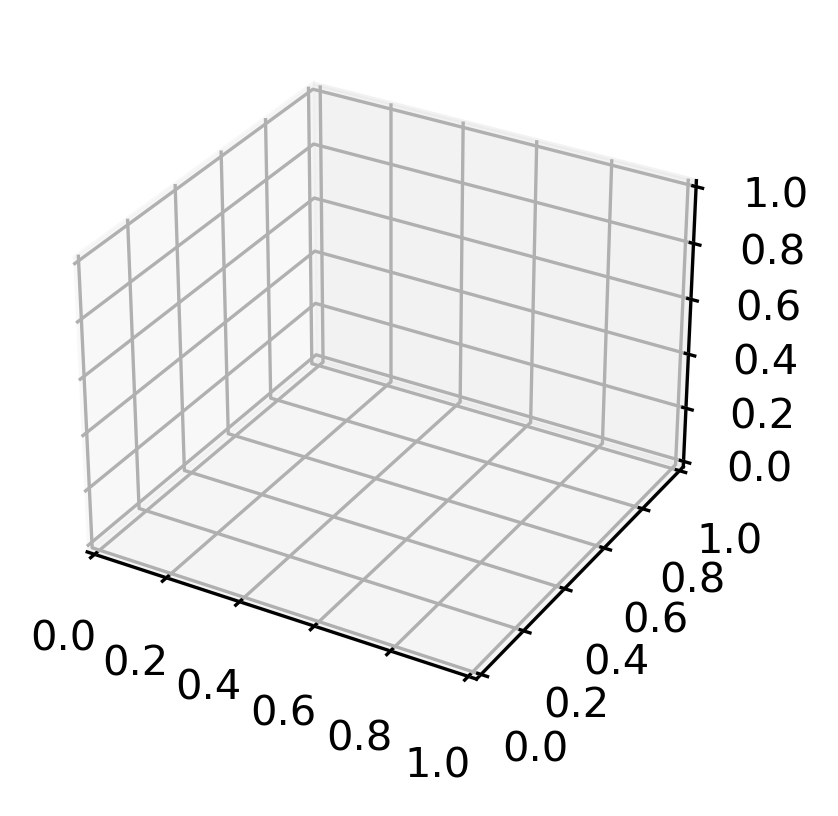

In [280]:
# Create a 3D scatter plot
fig = plt.figure(figsize=(3, 3), dpi=300)
ax = fig.add_subplot(111, projection="3d")
cmap = plt.get_cmap("turbo")
for l in range(1, labeled.max() + 1):
    x, y, z = np.where(labeled == l)
    color = cmap(l / labeled.max())
    ax.scatter(z, y, x, marker=".", label=f"l={l}", color=color)
ax.set_xlabel("Time")
ax.set_ylabel("Frequency")
ax.set_zlabel("Channels", labelpad=-5)
ax.view_init(elev=0, azim=45)

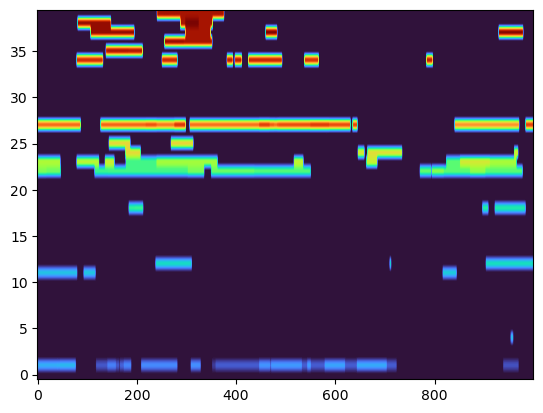

In [232]:
plt.imshow(labeled.max(1), aspect="auto", cmap="turbo", origin="lower")

#### Decompose signal in time-frequency domain

In [15]:
freqs = np.linspace(3, 10, 50)

W_theta = tfr_array_morlet(
    composite.isel(bands=[0]),
    1000,
    freqs,
    n_cycles=12,
    n_jobs=30,
).squeeze()

dims = ("batches", "freqs", "times")
coords = dict(freqs=freqs)
W_theta = xr.DataArray((W_theta * W_theta.conj()).real, dims=dims, coords=coords)

[Parallel(n_jobs=30)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=30)]: Done   1 out of   1 | elapsed:  1.2min finished


In [16]:
freqs = np.linspace(40, 150, 50)

W_gamma = tfr_array_morlet(
    composite.isel(bands=[1]),
    1000,
    freqs,
    n_cycles=freqs / 2,
    n_jobs=30,
).squeeze()

dims = ("batches", "freqs", "times")
coords = dict(freqs=freqs)
W_gamma = xr.DataArray((W_gamma * W_gamma.conj()).real, dims=dims, coords=coords)

[Parallel(n_jobs=30)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=30)]: Done   1 out of   1 | elapsed:  1.1min finished


In [17]:
x = composite.isel(bands=0, batches=0)
y = composite.isel(bands=1, batches=0)

x = (x - x.mean("times")) / (7 * x.std("times"))
y = (y - y.mean("times")) / (y.std("times"))

(2500.0, 5000.0)

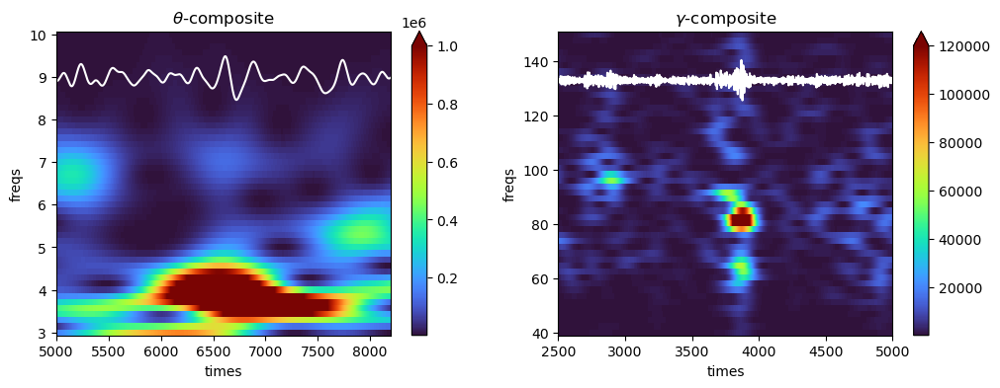

In [18]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
W_theta[0].plot(cmap="turbo", vmax=1e6)
plt.plot(x + 9, "w")
plt.title(r"$\theta$-composite")
plt.xlim(5000, 8200)

plt.subplot(1, 2, 2)
W_gamma[0].plot(cmap="turbo", vmax=120000)
plt.plot(y + 133, "w")
plt.title(r"$\gamma$-composite")
plt.xlim(2500, 5000)

#### Burst detection

In [96]:
def return_labeled_image(img: list, threshold: float):
    """
    Label regions in a binary image using a given threshold.

    Parameters:
    - img (numpy.ndarray): The binary image to label.
    - threshold (float): The threshold for labeling.

    Returns:
    - numpy.ndarray: A labeled image with connected regions.
    - numpy.ndarray: Array of unique labels.
    - int: The number of unique labels.

    This function labels connected regions in a binary image based on a given threshold.
    It uses the `ski.measure.label` function from the scikit-image library to perform
    the labeling. The resulting labeled image contains connected regions with unique
    labels, and the number of labels is also returned.

    Example:
    labeld_image, labels, nlabels = return_labeled_image(binary_img, 0.5)
    """
    # Labeled image
    labeld_image = ski.measure.label(img > threshold, background=0)
    # Get unique labels
    labels = np.unique(labeld_image)[1:]
    # Number of labels
    nlabels = len(labels)

    return labeld_image, labels, nlabels


def detect_burts(
    spectra: xr.DataArray,
    init_threshold: float,
    min_threshold: float,
    gamma: float,
    relative: bool = True,
):
    """
    Detect bursts in spectra using a dynamic thresholding approach.

    Parameters:
    - spectra (numpy.ndarray): The input spectra to analyze.
    - init_threshold (float): The initial threshold for labeling.
    - min_threshold (float): The minimum threshold to stop the labeling process.

    Returns:
    - numpy.ndarray: An image with labeled bursts.

    This function detects bursts in a given spectra by iteratively updating a labeling
    based on threshold values. It starts with an initial threshold, and in each iteration,
    it updates the labeling using a lower threshold. The process continues until the
    threshold reaches the minimum threshold value. The resulting labeled image contains
    burst regions.

    Note: The input spectra are first z-scored before applying labeling.

    Example:
    labeled_bursts = detect_burts(spectra_data, 2.0, 1.0)
    """
    # Dimensions of the spectra
    size = spectra.shape
    # z-score spectra
    if relative:
        z = (spectra - spectra.mean("times")) / spectra.std("times")
    else:
        z = (spectra - spectra.mean()) / spectra.std()
    # label image using initial threshold
    labeled_image, labels, nlabels = return_labeled_image(z, init_threshold)

    # Update threshold
    thr = init_threshold - gamma

    while thr >= min_threshold:

        # Label image for new threshold
        new_labeled_image, new_labels, new_nlabels = return_labeled_image(z, thr)
        # Work with the flattened matrix
        new_labeled_image = new_labeled_image.reshape(-1)

        # Copy original image
        temp = labeled_image.copy().reshape(-1)
        # Get biggest label
        max_label = labels.max()

        # Check mergings of burts
        for nl in new_labels:
            # For a given label in the new labeled image
            index_nl = np.where(new_labeled_image == nl)[0]
            # Check if in the previous one it corresponded to two or more burts
            if len(np.unique(temp[index_nl])) > 2:
                # If yes, keep old labeling
                new_labeled_image[index_nl] = temp[index_nl]

        # Check if new labels contain old ones
        for nl in new_labels:
            # For a given label in the new labeled image
            intersection = []
            index_nl = np.where(new_labeled_image == nl)[0]
            # For a given label in the old labeled image
            for l in labels:
                # Keep the indexes where new-contains-old labels
                index_l = np.where(labeled_image == l)[0]
                if len(np.isin(index_l, index_nl)):
                    intersection.append(l)

            # Update region of intersect in case any was found
            if len(intersection) > 0:
                intersection = np.hstack(intersection)
                indexes = np.where(np.intersect1d(temp, intersection))
                temp[index_nl] = intersection.max()
            else:
                max_label = max_label + 1
                temp[index_nl] = max_label

        # Update labeled image
        labeled_image, labels, nlabels = new_labeled_image, new_labels, new_nlabels
        # Update threshold
        thr = thr - gamma

    # Reset labels in the final image
    labeled_image, labels, nlabels = return_labeled_image(
        labeled_image.reshape(size), 0
    )

    return labeled_image

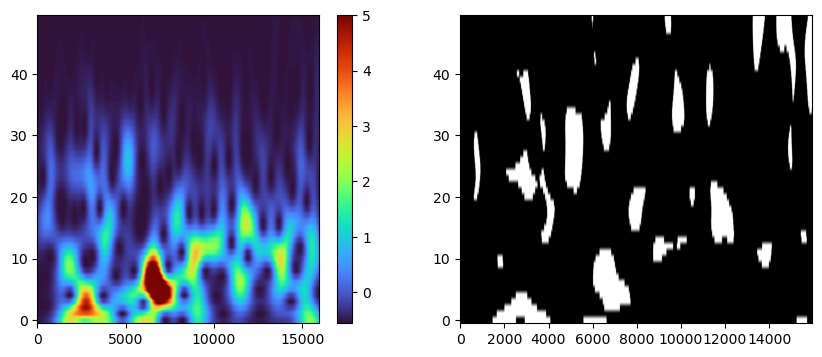

In [98]:
z = W_theta[0]
z = (z - z.mean()) / z.std()
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(z, aspect="auto", origin="lower", cmap="turbo", vmax=5)
plt.colorbar()
plt.subplot(1, 2, 2)
plt.imshow(
    detect_burts(W_theta[0], 5, 1, 0.1) > 0,
    aspect="auto",
    origin="lower",
    cmap="binary_r",
)

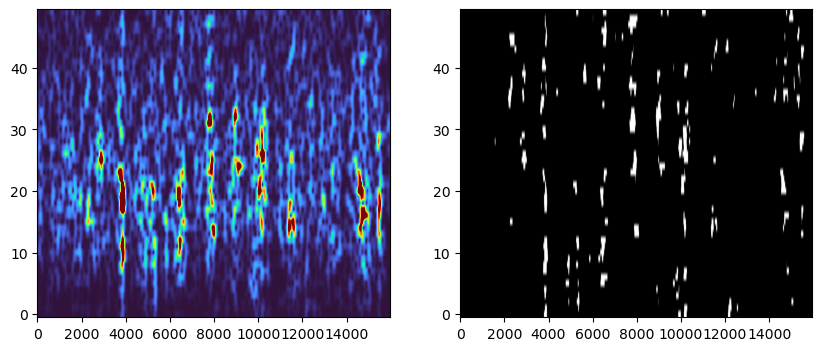

In [99]:
z = W_gamma[0]
z = (z - z.mean()) / z.std()
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(z, aspect="auto", origin="lower", cmap="turbo", vmax=5)
plt.subplot(1, 2, 2)
plt.imshow(
    detect_burts(W_gamma[0], 6, 2, 0.1) > 0,
    aspect="auto",
    origin="lower",
    cmap="binary_r",
)

In [34]:
pos = 0
z = (W_gamma[pos] - W_gamma[pos].std()) / W_gamma[pos].std()

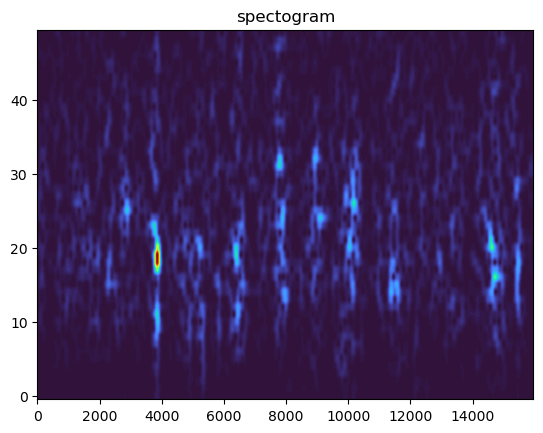

In [35]:
plt.imshow(W_gamma[pos], origin="lower", aspect="auto", cmap="turbo")
plt.title("spectogram")
plt.savefig("figures/frame1.png", dpi=300)

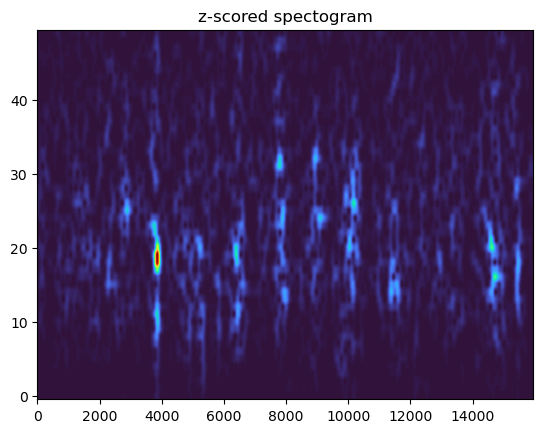

In [36]:
plt.imshow(
    z,
    origin="lower",
    aspect="auto",
    cmap="turbo",
)
plt.title("z-scored spectogram")
plt.savefig("figures/frame2.png", dpi=300)

In [37]:
frame = 3
for thr in [4, 3, 2, 1]:
    mask = detect_burts(W_gamma[pos], 5, thr, 0.1) > 0
    x = np.nan * (z * mask) + z
    plt.imshow(
        z * (np.where(mask, np.nan, mask) + 1),
        origin="lower",
        aspect="auto",
        cmap="turbo",
    )
    plt.title(f"threshold = {thr} STDs")
    plt.savefig(f"figures/frame{frame}.png", dpi=300)
    plt.close()
    frame = frame + 1
plt.tight_layout()

<Figure size 640x480 with 0 Axes>

#### Burst feature extraction

In [100]:
def extract_features(W, labeled_bursts):

    unique_labels = np.unique(labeled_bursts)[1:]
    nlabels = len(unique_labels)

    # Avg. and STD of each burst
    mean_amplitude = np.empty(nlabels)
    std_amplitude = np.empty(nlabels)

    # Avg., STD of the frequency of each burst and their weighted version
    mean_freq = np.empty(nlabels)
    std_freq = np.empty(nlabels)
    w_mean_freq = np.empty(nlabels)
    w_std_freq = np.empty(nlabels)
    peak_freq = np.empty(nlabels)

    # Avg., STD of the time of each burst and their weighted version
    mean_time = np.empty(nlabels)
    std_time = np.empty(nlabels)
    w_mean_time = np.empty(nlabels)
    w_std_time = np.empty(nlabels)
    t_start = np.empty(nlabels)
    t_stop = np.empty(nlabels)
    duration = np.empty(nlabels)

    labels_flattened = labeled_bursts.reshape(-1)
    W_stacked = W.stack(flat=("freqs", "times"))

    times = W_stacked.times.data
    freqs = W_stacked.freqs.data

    for pos, label in enumerate(unique_labels):
        mean_amplitude[pos] = W_stacked[labels_flattened == label].mean()
        std_amplitude[pos] = W_stacked[labels_flattened == label].std()

        mean_freq[pos] = freqs[labels_flattened == label].mean()
        std_freq[pos] = freqs[labels_flattened == label].std()
        w_mean_freq[pos], w_std_freq[pos] = weighted_avg_and_std(
            freqs[labels_flattened == label], W_stacked[labels_flattened == label]
        )
        peak_freq[pos] = freqs[labels_flattened == label].max()

        mean_time[pos] = times[labels_flattened == label].mean()
        std_time[pos] = times[labels_flattened == label].std()
        w_mean_time[pos], w_std_time[pos] = weighted_avg_and_std(
            times[labels_flattened == label], W_stacked[labels_flattened == label]
        )

        t_start[pos] = times[labels_flattened == label].min()
        t_stop[pos] = times[labels_flattened == label].max()

        duration[pos] = t_stop[pos] - t_start[pos]

    return (
        mean_amplitude,
        std_amplitude,
        mean_freq,
        std_freq,
        w_mean_freq,
        w_std_freq,
        peak_freq,
        mean_time,
        std_time,
        w_mean_time,
        w_std_time,
        t_start,
        t_stop,
        duration,
    )

In [102]:
def _for_batch(W):
    init = int(((W.max("times") - W.mean("times")) / W.std("times")).max().data.item())
    return detect_burts(W, init, 1, 0.1)


# define the function to compute in parallel
parallel, p_fun = parallel_func(_for_batch, verbose=False, n_jobs=20, total=100)

labeled_theta_bursts = parallel(p_fun(W) for W in W_theta[:100])

  0%|          |  : 0/100 [00:00<?,       ?it/s]

In [103]:
labeled_theta_bursts = np.stack(labeled_theta_bursts)

In [104]:
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- NumPy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values - average) ** 2, weights=weights)
    return (average, np.sqrt(variance))

In [105]:
feature_names = [
    "mean_amplitude",
    "std_amplitude",
    "mean_freq",
    "std_freq",
    "w_mean_freq",
    "w_std_freq",
    "peak_freq",
    "mean_time",
    "std_time",
    "w_mean_time",
    "w_std_time",
    "t_start",
    "t_stop",
    "duration",
]

features = {}

for name in feature_names:

    features[name] = []

for i in tqdm(range(100)):
    out = extract_features(W_theta[i], labeled_theta_bursts[i])
    for pos, name in enumerate(feature_names):
        features[name] += [out[pos]]



  0%|                                                                 | 0/100 [00:00<?, ?it/s]

  1%|▌                                                        | 1/100 [00:00<00:26,  3.70it/s]

  2%|█▏                                                       | 2/100 [00:00<00:26,  3.70it/s]

  3%|█▋                                                       | 3/100 [00:00<00:24,  3.92it/s]

  4%|██▎                                                      | 4/100 [00:01<00:23,  4.02it/s]

  5%|██▊                                                      | 5/100 [00:01<00:24,  3.95it/s]

  6%|███▍                                                     | 6/100 [00:01<00:21,  4.43it/s]

  7%|███▉                                                     | 7/100 [00:01<00:21,  4.40it/s]

  8%|████▌                                                    | 8/100 [00:01<00:21,  4.36it/s]

  9%|█████▏                                                   | 9/100 [00:02<00:21,  4.32it/s]

 10%|█████▌                           

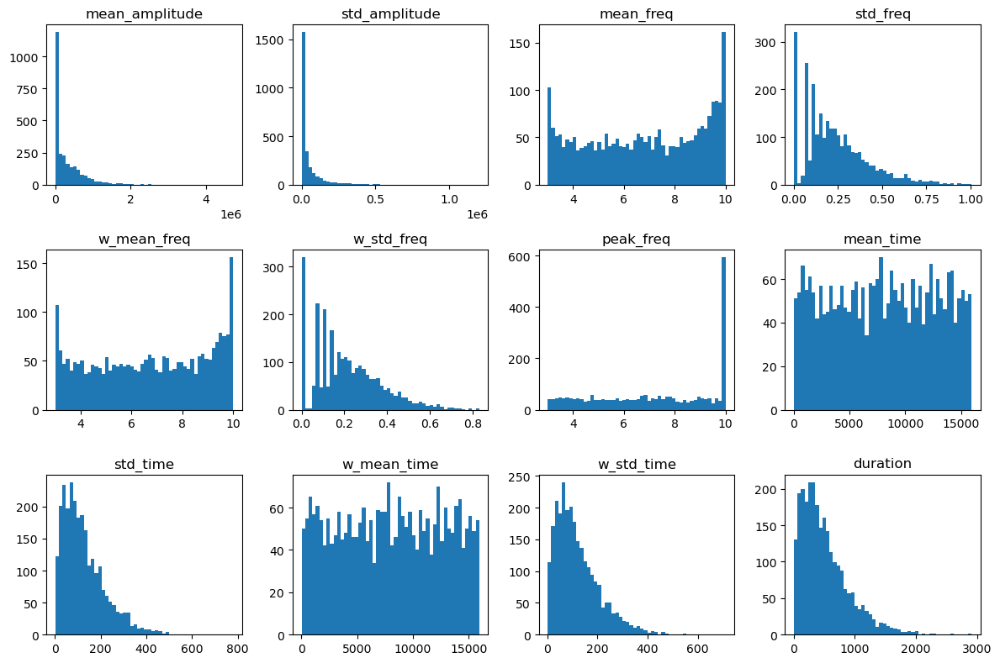

In [106]:
plt.figure(figsize=(12, 8))
pos = 1
for name in feature_names:
    if name not in ["t_start", "t_stop"]:
        plt.subplot(3, 4, pos)
        plt.hist(np.hstack(features[name]), 50)
        plt.title(name)
        pos = pos + 1
plt.tight_layout()

In [ ]:
def _for_batch(W):
    init = int(((W.max("times") - W.mean("times")) / W.std("times")).max().data.item())
    return detect_burts(W, init, 1, 0.1)


# define the function to compute in parallel
parallel, p_fun = parallel_func(_for_batch, verbose=False, n_jobs=20, total=100)

labeled_gamma_bursts = parallel(p_fun(W) for W in W_gamma[:100])

  0%|          |  : 0/100 [00:00<?,       ?it/s]

In [ ]:
labeled_gamma_bursts = np.stack(labeled_gamma_bursts)

In [ ]:
features_gamma = {}

for name in feature_names:

    features_gamma[name] = []

for i in tqdm(range(100)):
    out = extract_features(W_gamma[i], labeled_gamma_bursts[i])
    for pos, name in enumerate(feature_names):
        features_gamma[name] += [out[pos]]

In [ ]:
plt.figure(figsize=(12, 8))
pos = 1
for name in feature_names:
    if name not in ["t_start", "t_stop"]:
        plt.subplot(3, 4, pos)
        plt.hist(np.hstack(features_gamma[name]), 50)
        plt.title(name)
        pos = pos + 1
plt.tight_layout()

In [ ]:
import matplotlib as mpl

plt.figure(figsize=(9, 3.5))

plt.subplot(121)

plt.hist2d(
    np.hstack(features["mean_freq"]),
    np.log(np.hstack(features["mean_amplitude"])),
    bins=(20, 20),
    norm=mpl.colors.LogNorm(),
    cmap="turbo",
)
plt.ylabel("log(Amplitude)")
plt.xlabel("frequency [Hz]")
plt.title(r"$\theta$-bursts")
plt.colorbar()

plt.subplot(122)

plt.hist2d(
    np.hstack(features_gamma["mean_freq"]),
    np.log(np.hstack(features_gamma["mean_amplitude"])),
    bins=(20, 20),
    norm=mpl.colors.LogNorm(),
    cmap="turbo",
)
plt.ylabel("log(Amplitude)")
plt.xlabel("frequency [Hz]")
plt.title(r"$\gamma$-bursts")
plt.colorbar()

plt.tight_layout()

In [55]:
import numba as nb


@nb.njit
def overlaps(theta_timings: list, gamma_timings: list):
    n_theta = len(theta_timings)
    n_gamma = len(gamma_timings)

    n_overlaps = np.empty(n_gamma, dtype=np.int8)

    for i in range(n_gamma):
        temp = np.logical_and(
            theta_timings[:, 0] - gamma_timings[i, 0] < 0,
            theta_timings[:, 1] - gamma_timings[i, 0] > 0,
        )

        temp = np.logical_and(
            temp,
            np.logical_and(
                theta_timings[:, 0] - gamma_timings[i, 1] < 0,
                theta_timings[:, 1] - gamma_timings[i, 1] > 0,
            ),
        )

        n_overlaps[i] = temp.sum()

    return n_overlaps

In [56]:
n_overlaps = []

for i in range(100):

    T_theta = np.stack((features["t_start"][i], features["t_stop"][i]), axis=1)
    T_gamma = np.stack(
        (features_gamma["t_start"][i], features_gamma["t_stop"][i]), axis=1
    )

    n_overlaps += [overlaps(T_theta, T_gamma)]

In [57]:
n_overlaps = np.hstack(n_overlaps)
amplitudes = np.hstack(features_gamma["mean_amplitude"])

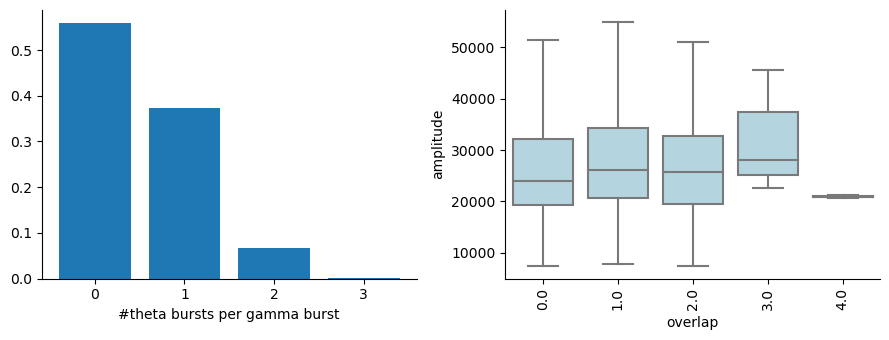

In [58]:
plt.figure(figsize=(9, 3.5))

ax = plt.subplot(121)
n, x = np.histogram(n_overlaps, bins=[0, 1, 2, 3, 4])
plt.bar(x[:-1], n / n.sum())
plt.xlabel("#theta bursts per gamma burst")
[ax.spines[key].set_visible(False) for key in ["top", "right"]]
ax = plt.subplot(122)
import pandas as pd
import seaborn as sns

df = pd.DataFrame(
    np.stack((n_overlaps, amplitudes), axis=1), columns=["overlap", "amplitude"]
)
sns.boxplot(data=df, x="overlap", y="amplitude", showfliers=False, color="lightblue")
[ax.spines[key].set_visible(False) for key in ["top", "right"]]

plt.xticks(rotation=90)

plt.tight_layout()

In [66]:
SIZES = []
FREQS = []

for pos in tqdm(range(100)):

    times = W_gamma[pos].stack(flat=("freqs", "times")).times.data
    freqs = W_gamma[pos].stack(flat=("freqs", "times")).freqs.data

    labeled_bursts = labeled_gamma_bursts[pos].reshape(-1)

    unique_labels = np.unique(labeled_bursts)[1:]
    n_labels = len(unique_labels)

    S = np.zeros((n_labels, n_labels))
    F_min = np.zeros(n_labels)
    F_max = np.zeros(n_labels)
    F_mean = np.zeros(n_labels)

    for l_i in unique_labels - 1:
        F_min[l_i] = freqs[labeled_bursts == l_i + 1].min()
        F_max[l_i] = freqs[labeled_bursts == l_i + 1].max()
        F_mean[l_i] = freqs[labeled_bursts == l_i + 1].mean()

    for l_i in range(n_labels - 1):
        times_i = times[labeled_bursts == l_i + 1]
        s_i = len(times_i)
        for l_j in range(l_i, n_labels):
            if F_max[l_i] < F_min[l_j]:
                times_j = times[labeled_bursts == l_j + 1]
                s_j = len(times_j)
                S[l_i, l_j] = len(np.intersect1d(times_i, times_j)) / np.min((s_i, s_j))
    np.fill_diagonal(S, 0)
    SIZES += [S]
    FREQS += [F_mean]


100%|███████████████████████████████████████████████████████| 100/100 [00:44<00:00,  2.26it/s]


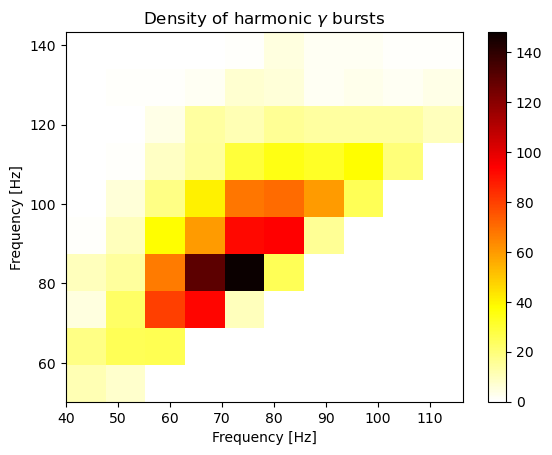

In [68]:
x, y = [], []
for i in range(len(SIZES)):
    pi, pj = np.where(SIZES[i] > 0.95)
    x += [FREQS[i][pi]]
    y += [FREQS[i][pj]]

x = np.hstack(x)
y = np.hstack(y)
plt.hist2d(x, y, cmap="hot_r")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Frequency [Hz]")
plt.title(r"Density of harmonic $\gamma$ bursts")
plt.colorbar()

In [64]:
SIZES = []
FREQS = []

for pos in tqdm(range(100)):

    times = W_theta[pos].stack(flat=("freqs", "times")).times.data
    freqs = W_theta[pos].stack(flat=("freqs", "times")).freqs.data

    labeled_bursts = labeled_theta_bursts[pos].reshape(-1)

    unique_labels = np.unique(labeled_bursts)[1:]
    n_labels = len(unique_labels)

    S = np.zeros((n_labels, n_labels))
    F_min = np.zeros(n_labels)
    F_max = np.zeros(n_labels)
    F_mean = np.zeros(n_labels)

    for l_i in unique_labels - 1:
        F_min[l_i] = freqs[labeled_bursts == l_i + 1].min()
        F_max[l_i] = freqs[labeled_bursts == l_i + 1].max()
        F_mean[l_i] = freqs[labeled_bursts == l_i + 1].mean()

    for l_i in range(n_labels - 1):
        times_i = times[labeled_bursts == l_i + 1]
        s_i = len(times_i)
        for l_j in range(l_i, n_labels):
            if F_max[l_i] < F_min[l_j]:
                times_j = times[labeled_bursts == l_j + 1]
                s_j = len(times_j)
                S[l_i, l_j] = len(np.intersect1d(times_i, times_j)) / np.min((s_i, s_j))
    np.fill_diagonal(S, 0)
    SIZES += [S]
    FREQS += [F_mean]


100%|███████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.15it/s]


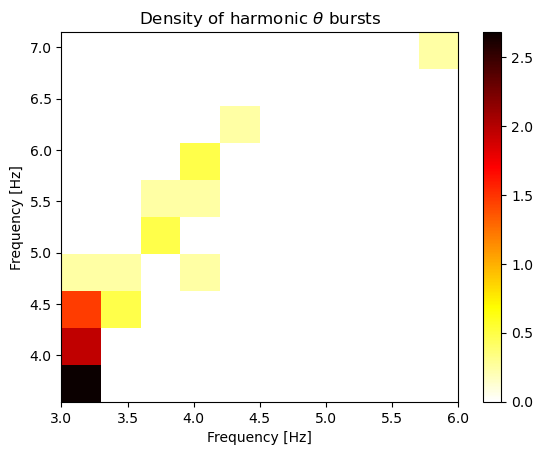

In [65]:
x, y = [], []
for i in range(len(SIZES)):
    pi, pj = np.where(SIZES[i] > 0.95)
    x += [FREQS[i][pi]]
    y += [FREQS[i][pj]]

x = np.hstack(x)
y = np.hstack(y)
plt.hist2d(x, y, cmap="hot_r", density=True)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Frequency [Hz]")
plt.title(r"Density of harmonic $\theta$ bursts")
plt.colorbar()

In [73]:
np.where(n_overlaps[:36] == 2)

(array([15]),)

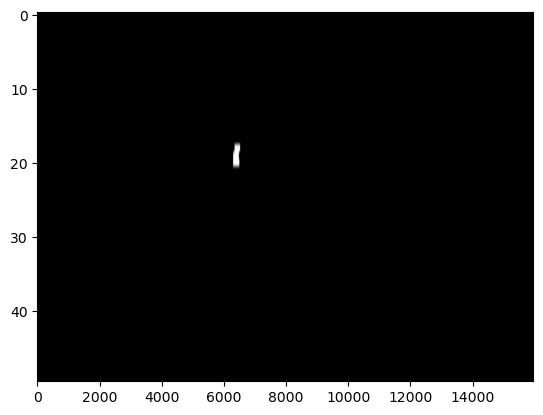

In [91]:
plt.imshow(labeled_gamma_bursts[0] == 16, aspect="auto", cmap="binary_r")

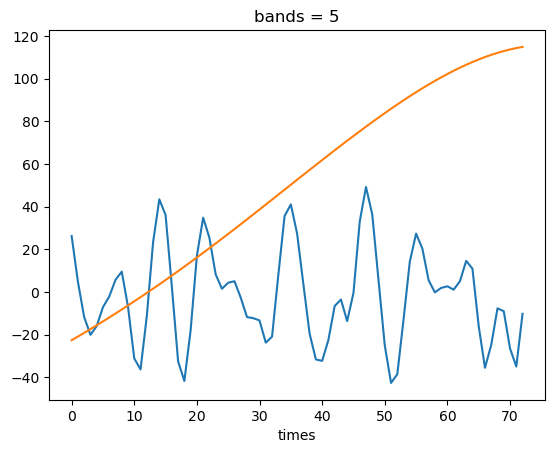

In [93]:
composite.isel(bands=1, times=slice(6539, 6612), batches=0).plot()
composite.isel(bands=0, times=slice(6539, 6612), batches=0).plot()

In [92]:
W_gamma.times.data[(labeled_gamma_bursts[0] == 26).sum(0) > 0]

array([6539, 6540, 6541, 6542, 6543, 6544, 6545, 6546, 6547, 6548, 6549,
       6550, 6551, 6552, 6553, 6554, 6555, 6556, 6557, 6558, 6559, 6560,
       6561, 6562, 6563, 6564, 6565, 6566, 6567, 6568, 6569, 6570, 6571,
       6572, 6573, 6574, 6575, 6576, 6577, 6578, 6579, 6580, 6581, 6582,
       6583, 6584, 6585, 6586, 6587, 6588, 6589, 6590, 6591, 6592, 6593,
       6594, 6595, 6596, 6597, 6598, 6599, 6600, 6601, 6602, 6603, 6604,
       6605, 6606, 6607, 6608, 6609, 6610, 6611, 6612])